<div class="alert alert-block alert-info">
This notebook would not have been possible without the help and commitment of the oppen-source software community involved in Pangeo, Xarray, Dask, Numpy, OpenEO, Pandas, GeoPandas. Communities who act in the silence of the universe and make people marvel as they look at the opensource sky.
</div>

# Purpose

This notebook demonstrates how `Pangeo` and `Holoviz` open-source software stack facilitates computing and visualizing the Vegetation Condition Index (VCI) ([1] Kogan, 1995), a well-established indicator to estimate droughts from remote sensing data.

VCI compares the current normalized difference vegetation index (NDVI) \[2] to the range of values observed in previous years.

We will use Sentinel-3 NDVI Analisis Ready Data (ARD) and Long Term Statistics (1999-2019) product provided by the Copernicus Global Land Service \[3].

Both datasets are discovered through the OpenEO API\[5] from the CGLS distributor VITO \[4] and an [EGI registration](https://aai.egi.eu/) is needed.

Further info about drought indexes can be found in the Integrated Drought Management Programme \[5]

\[1] [Application of vegetation index and brightness temperature for drought detection](https://www.sciencedirect.com/science/article/abs/pii/027311779500079T)
\[2] [NDVI](https://en.wikipedia.org/wiki/Normalized_difference_vegetation_index)
\[3] [Copernicus Global Land Service](https://land.copernicus.eu/global/index.html)
\[4] [Vito](https://vito.be/en)
\[5] [OpenEO](https://openeo.org/)
\[5] [Integrated Drought Management](https://www.droughtmanagement.info/indices)

# Setup

Let's install `openeo`, an open source interface that facilitates standardized interchange between users and applications of Copernicus and other EO data as hosted by an increasing number of cloud providers.

In [1]:
import pkg_resources
if not any(list(map(lambda i: i.key == 'openeo', pkg_resources.working_set))):
    !pip install openeo

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.3/203.3 kB 1.7 MB/s eta 0:00:00a 0:00:01


The libraries are grouped by their function with a short comment describing their main purpose. 

In [6]:
# data
import numpy as np #arrays
import pandas as pd #dataframes
import xarray as xr #multidimensional arrays
import geopandas as gpd #geospatial vector data
import zarr

# visualization
import matplotlib.pyplot as plt
import holoviews as hv
import hvplot.xarray

### Selection of Area of interest (AOI)

To define the area of interest the Global Administrative Unit Layers [GAUL G2015_2014](https://data.apps.fao.org/map/catalog/srv/eng/catalog.search#/metadata/9c35ba10-5649-41c8-bdfc-eb78e9e65654) from FAO-UN [Documentation](https://data.apps.fao.org/map/catalog/srv/api/records/9c35ba10-5649-41c8-bdfc-eb78e9e65654/attachments/GAUL2015_Documentation.zip) is going to be used.
As the original dataset is distributed through shapefile is needed to take leverage of [GeoPandas](https://geopandas.org/en/stable/) that extends the capabilities of [Pandas](https://pandas.pydata.org/) to deal with geometry and spatial operations.

In [ ]:
GAUL = gpd.read_file('zip+https://mars.jrc.ec.europa.eu/asap/files/gaul1_asap.zip')

Data are organized in a tabular structure. For each element an index a data (made of columns) and a geometry is defined.

![](./images/dataframe.svg "table")

Geometry are defined through [shapely](https://shapely.readthedocs.io/en/stable/) geometry objects with three different basic classes:

Points | Multi-Points
Lines | Multi-Lines
Polygons | Multi-Polygons

In [4]:
GAUL

,asap1_id,name1,name1_shr,name0,asap0_id,name0_shr,km2_tot,km2_crop,km2_range,an_crop,an_range,water_lim,geometry
0,263,Damietta,Damietta,Egypt,79,Egypt,928,550,0,1,0,1,"POLYGON ((31.84469 31.52698, 31.84601 31.52356..."
1,2141,Ninh Binh,Ninh Binh,Viet Nam,134,Viet Nam,1362,1035,80,1,0,0,"POLYGON ((105.77766 20.43617, 105.77976 20.435..."
2,10070,Segen Peoples,Segen Peoples,Ethiopia,185,Ethiopia,6813,382,6288,1,1,1,"POLYGON ((37.90356 5.95984, 37.92241 5.95941, ..."
3,2150,Thai Binh,Thai Binh,Viet Nam,134,Viet Nam,1559,1189,51,1,0,0,"POLYGON ((106.41657 20.71235, 106.41279 20.711..."
4,2001,Tekirdag,Tekirdag,Turkey,49,Turkey,6237,4561,1188,1,1,1,"POLYGON ((28.16894 41.47137, 28.18175 41.46005..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2376,2432,Busia,Busia,Kenya,163,Kenya,1630,1403,331,1,1,0,"POLYGON ((34.35920 0.77981, 34.35810 0.77448, ..."
2377,908,Katanga,Katanga,Democratic Republic of the Congo,157,D.R. Congo,486728,18137,29769,1,1,1,"POLYGON ((26.96836 -4.99952, 27.60211 -5.01657..."
2378,861,Kampot,Kampot,Cambodia,132,Cambodia,4848,2028,427,1,1,0,"POLYGON ((104.41953 10.44244, 104.41708 10.441..."
2379,7,Ostgronland,Ostgronland,Greenland,26,Greenland,1038062,0,0,0,0,0,"MULTIPOLYGON (((-25.69534 71.04207, -25.69718 ..."


Selection can be achieved through the same semantic as in Pandas. As here the attention is on the geometry the only geometrical component is kept.

In [ ]:
AOI_name = 'Lombardia'
AOI_poly = GAUL[GAUL.name1 == AOI_name].geometry

Geopandas brings the possibility to interrogate attributes like area, bounds, total_bounds etc...
In this specific case a single object has been selected so bounds can be used to retreat the max and min coordinates on each axis. If multiple areas had been selected then total_bounds gives back the max/min coordinates for the entire GeoSeries.

In [ ]:
AOI_min_lon, AOI_min_lat, AOI_max_lon, AOI_max_lat = AOI_poly.bounds.values.tolist()[0]

## Data retreat

As already mentioned Copernicus Global Land Service ARD NDVI 300m dataset is going to be used.

Datasets can be downloaded directly through the [official portal](https://land.copernicus.eu/global/index.html) but, if not ordered through the legacy portal, files are in the order of 2GB each.
There are two main technologies to explore and retread datasets. STAC and openEO. More or less they are similar but here, the VITO's openEO service, at the time of writing, isn't fully compatible with STAC we will rely on openEO.
This will make possible to retreat just a portion of data and keep the process affordable even with low connections.

Note: OpenEO is an open application programming interface (API) that connects clients like R, Python and JavaScript to big Earth observation cloud back-ends. More infos [here](https://openeo.org/)
Authentication can be acheived through the [OIDC](https://openid.net/connect/) using the EGI credentials.

The ***BIGGEST*** difference between Xarray (and consequentially Pangeo) and openEO is that Xarray is ***domain-agnostic*** instead openEO, as the name suggest, is dedicated to the analysis of Earth Observation data.

In [6]:
session = openeo.connect("https://openeo.vito.be").authenticate_oidc(provider_id="egi")

Authenticated using refresh token.


As all the libraries there is a catalog of the products that here are named as Collections.

In [7]:
session.list_collections()

[{'description': 'Sentinel 1 GRD Sigma0, mosaic of all ascending relative orbits. Backscatter values are provided as natural number, not in decibel. Provided by Terrascope.\n\n Use [this viewer](https://viewer.terrascope.be/?language=en&bbox=2.8531494643539195,50.29627033037724,6.36877446435392,51.454777120718546&overlay=true&bgLayer=Satellite&date=2020-10-15&layer=CGS_S1_GRD_SIGMA0) to explore the data.',
  'extent': {'spatial': {'bbox': [[-180, -56, 180, 83]]},
   'temporal': {'interval': [['2015-07-06T00:00:00Z', None]]}},
  'id': 'S1_GRD_SIGMA0_ASCENDING',
  'keywords': ['VITO',
   'TERRASCOPE',
   'COPERNICUS',
   'ESA',
   'Orthoimagery',
   'SENTINEL-1',
   'C-SAR',
   'Level-3',
   'Radar',
   'Radar Backscatter'],
  'license': 'free',
  'links': [{'href': 'https://docs.terrascope.be/#/DataProducts/Sentinel-1/ProductsOverview',
    'rel': 'alternate',
    'title': 'Product web page.'},
   {'href': 'https://services.terrascope.be/wmts/v2',
    'rel': 'wmts',
    'wmts:layer': 'CGS_S1_GRD_SIGMA0'}],
  'providers': [{'name': 'Terrascope/VITO'}],
  'stac_extensions': ['datacube'],
  'stac_version': '0.9.0',
  'title': 'Sentinel 1 GRD Sigma0 product, VH, VV and angle.'},
 {'description': 'Sentinel 1 GRD Sigma0, mosaic of all descending relative orbits. Backscatter values are provided as natural number, not in decibel. Provided by Terrascope.\n\n Use [this viewer](https://viewer.terrascope.be/?language=en&bbox=2.8531494643539195,50.29627033037724,6.36877446435392,51.454777120718546&overlay=true&bgLayer=Satellite&date=2020-10-15&layer=CGS_S1_GRD_SIGMA0) to explore the data.',
  'extent': {'spatial': {'bbox': [[-180, -56, 180, 83]]},
   'temporal': {'interval': [['2015-07-06T00:00:00Z', None]]}},
  'id': 'S1_GRD_SIGMA0_DESCENDING',
  'keywords': ['VITO',
   'TERRASCOPE',
   'COPERNICUS',
   'ESA',
   'Orthoimagery',
   'SENTINEL-1',
   'C-SAR',
   'Level-3',
   'Radar',
   'Radar Backscatter'],
  'license': 'free',
  'links': [{'href': 'https://docs.terrascope.be/#/DataProducts/Sentinel-1/ProductsOverview',
    'rel': 'alternate',
    'title': 'Product web page.'},
   {'href': 'https://services.terrascope.be/wmts/v2',
    'rel': 'wmts',
    'wmts:layer': 'CGS_S1_GRD_SIGMA0'}],
  'providers': [{'name': 'Terrascope/VITO'}],
  'stac_extensions': ['datacube'],
  'stac_version': '0.9.0',
  'title': 'Sentinel 1 GRD Sigma0 product, VH, VV and angle.'},
 {'description': 'FAPAR Level-3 product at 10m resolution. Covers selected areas globally. This FAPAR is derived directly from ESA L2A products. The FAPAR quantifies the fraction of the solar radiation absorbed by live leaves for the photosynthesis activity. Then, it refers only to the green and alive elements of the canopy. The FAPAR depends on the canopy structure, vegetation element optical properties, atmospheric conditions, and angular configuration. \n\nFAPAR is recognized as an Essential Climate Variable (ECV) by the Global Climate Observing System (GCOS).',
  'extent': {'spatial': {'bbox': [[-180, -56, 180, 83]]},
   'temporal': {'interval': [['2015-07-06T00:00:00Z', None]]}},
  'id': 'TERRASCOPE_S2_FAPAR_V2',
  'keywords': ['VITO',
   'TERRASCOPE',
   'COPERNICUS',
   'ESA',
   'Orthoimagery',
   'SENTINEL-2',
   'MSI',
   'Level-3',
   'Radiometry',
   'Plant Resource',
   'FAPAR'],
  'license': 'proprietary',
  'links': [{'href': 'https://sentinel.esa.int/documents/247904/690755/Sentinel_Data_Legal_Notice',
    'rel': 'license'},
   {'href': 'https://services.terrascope.be/catalogue/description?collection=urn:eop:VITO:TERRASCOPE_S2_FAPAR_V2',
    'rel': 'alternate'},
   {'href': 'https://viewer.terrascope.be/?language=nl&bbox=0.9339867511378304,50.14520994379217,6.207424251137831,51.77292299745045&overlay=false&bgLayer=MapBox&date=2019-02-25T03:17:15.000Z&layer=CGS_S2_FAPAR',
    'rel': 'alternate',
    'title': 'Terrascope Viewer'},
   {'href': 'https://services.terrascope.be/wmts/v2',
    'rel': 'wmts',
    'wmts:layer': 'CGS_S2_FAPAR'}],
  'providers': [{'name': 'VITO, on

Metadata can be easily explored through a double click on the collection, or it can retract using the function .describe_collection()
'CGLS_NDVI300_V2_GLOBAL' stands for Copernicus Globa Land Service, NDVI index, 300m of nominal resolution, Version 2 of the algorithm and Global means Global coverage.

In [8]:
session.describe_collection('CGLS_NDVI300_V2_GLOBAL')

{'cube:dimensions': {'bands': {'type': 'bands',
   'values': ['NDVI', 'NDVI_unc', 'NOBS', 'QFLAG']},
  't': {'extent': ['2020-07-01T00:00:00Z', None], 'type': 'temporal'},
  'x': {'axis': 'x',
   'extent': [-180, 180],
   'step': 0.002976190476204,
   'type': 'spatial'},
  'y': {'axis': 'y',
   'extent': [-60, 81],
   'step': 0.00297619047619,
   'type': 'spatial'}},
 'description': 'Global NDVI at 300m resolution, 10-daily. The Normalized Difference Vegetation Index (NDVI) is an indicator of the greenness of the biomes. As such, it is closely linked to the FAPAR. The CGLS Collection 300m NDVI V2 product is based on data from the Sentinel-3A and -3B OLCI sensor.',
 'extent': {'spatial': {'bbox': [[-180, -60, 180, 81]]},
  'temporal': {'interval': [['2020-07-01T00:00:00Z', None]]}},
 'id': 'CGLS_NDVI300_V2_GLOBAL',
 'license': 'free',
 'links': [{'href': 'https://land.copernicus.eu/global/products/ndvi',
   'rel': 'alternate',
   'title': 'Product web page.'}],
 'stac_extensions': ['datacube'],
 'stac_version': '0.9.0',
 'summaries': {},
 'title': 'Copernicus Global Land NDVI product V2, 300m resolution, 10-daily'}

Instead of request the entire dataset, to avoid useless transfer, a subset in time, space and band is requested.
In reality this is not going to download anything but is just a pointer to the data on the server.

In [9]:
datacube = session.load_collection(
    'CGLS_NDVI300_V2_GLOBAL',
    spatial_extent={"west": AOI_min_lon, "south":AOI_min_lat , "east": AOI_max_lon, "north":AOI_max_lat },
    temporal_extent = ["2022-01-01", "2022-08-01"],
    bands=['NDVI']
)

To complete the request and trigger the download a specific function has to be called. As output GeoTiff format can be an alternative.
Once loaded with xarray there no evident difference between formats. COG, Geotiff, NetCDF, NetCDF Zarr can be easily read.

In [10]:
datacube.download(f"C_GLS_NDVI_20220101_20220701_{AOI_name}_S3_2.nc", format="NetCDF")

## Basic Concepts

- Dataset and DataArray
- open a NedCDF through Xarray
- understanding the difference between coordinates and dimensions
- Get access to a Variable in a Dataset
- Get access to the attributes
- Selection method
- Plotting

In [11]:
cgls_ds= xr.open_dataset(f'C_GLS_NDVI_20220101_20220701_{AOI_name}_S3_2.nc')

As the dataset is in NetCDF format the system automatically select the correct engine (this underneath has been
conducted through the automatic specification of engine='netcdf'). Supposing that you have a dataset in an
unrecognised format you can create your own engine and pass it through the engine parameter.

Having a look to the content

In [ ]:
cgls_ds

Looooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooong description on how an xarray is structured.

Data array
   - Dimension
   - Coordinates
   - Values
   - Attributes

Data set
    - Attributes


A bit of terminology
'''' DataArray¶ A multi-dimensional array with labeled or named dimensions. DataArray objects add metadata such as dimension names, coordinates, and attributes (defined below) to underlying “unlabeled” data structures such as numpy and Dask arrays. If its optional name property is set, it is a named DataArray.
Dataset A dict-like collection of DataArray objects with aligned dimensions. Thus, most operations that can be performed on the dimensions of a single DataArray can be performed on a dataset. Datasets have data variables (see Variable below), dimensions, coordinates, and attributes.
Variable A NetCDF-like variable consisting of dimensions, data, and attributes which describe a single array. The main functional difference between variables and numpy arrays is that numerical operations on variables implement array broadcasting by dimension name. Each DataArray has an underlying variable that can be accessed via arr.variable. However, a variable is not fully described outside of either a Dataset or a DataArray.
Note
The Variable class is low-level interface and can typically be ignored. However, the word “variable” appears often enough in the code and documentation that is useful to understand.
Dimension In mathematics, the dimension of data is loosely the number of degrees of freedom for it. A dimension axis is a set of all points in which all but one of these degrees of freedom is fixed. We can think of each dimension axis as having a name, for example the “x dimension”. In xarray, a DataArray object’s dimensions are its named dimension axes, and the name of the i-th dimension is arr.dims[i]. If an array is created without dimension names, the default dimension names are dim_0, dim_1, and so forth.
Coordinate An array that labels a dimension or set of dimensions of another DataArray. In the usual one-dimensional case, the coordinate array’s values can loosely be thought of as tick labels along a dimension. There are two types of coordinate arrays: dimension coordinates and non-dimension coordinates (see below). A coordinate named x can be retrieved from arr.coords[x]. A DataArray can have more coordinates than dimensions because a single dimension can be labeled by multiple coordinate arrays. However, only one coordinate array can be a assigned as a particular dimension’s dimension coordinate array. As a consequence, len(arr.dims) <= len(arr.coords) in general.
Dimension coordinate A one-dimensional coordinate array assigned to arr with both a name and dimension name in arr.dims. Dimension coordinates are used for label-based indexing and alignment, like the index found on a pandas.DataFrame or pandas.Series. In fact, dimension coordinates use pandas.Index objects under the hood for efficient computation. Dimension coordinates are marked by * when printing a DataArray or Dataset.
Non-dimension coordinate A coordinate array assigned to arr with a name in arr.coords but not in arr.dims. These coordinates arrays can be one-dimensional or multidimensional, and they are useful for auxiliary labeling. As an example, multidimensional coordinates are often used in geoscience datasets when the data’s physical coordinates (such as latitude and longitude) differ from their logical coordinates. However, non-dimension coordinates are not indexed, and any operation on non-dimension coordinates that leverages indexing will fail. Printing arr.coords will print all of arr’s coordinate names, with the corresponding dimension(s) in parentheses. For example, coord_name (dim_name) 1 2 3 ….
Index An index is a data structure optimized for efficient selecting and slicing of an associated array. Xarray creates indexes for dimension coordinates so that operations along dimensions are fast, while non-dimension coordinates are not indexed. Under the hood, indexes are implemented as pandas.Index objects. The index associated with dimension name x can be retrieved by arr.indexes[x]. By construction, len(arr.dims) == len(arr.indexes) '''


Later on other datasets has dimension named according to the more common triad lat,lon,time. To avoid misunderstanding coords needs to be renamed.

In [13]:
cgls_ds = cgls_ds.rename(x='lon', y='lat', t='time')

In [ ]:
cgls_ds

DataArray, within Datasets, can be access through the dot notation .NameofVariable

In [ ]:
cgls_ds.NDVI

Same can be achieved for attributes but instead of a DataArray .attrs will return a dictionary.

In [ ]:
cgls_ds.NDVI.attrs

{'long_name': 'NDVI', 'units': '', 'grid_mapping': 'crs'}

Memory must be always taken into account. Each DataArray has an impact on it and to avoid issues like kill the kernel users must avoid to open data bigger than memory.
If the dataset is bigger then the best option would be to load it through the help of Dask in a lazy approach.
As the size of the data isn't too big we can continue without any problem.

In [17]:
print(f'{np.round(cgls_ds.NDVI.nbytes / 1024**2, 2)} MB')

12.33 MB


#### Selection methods

As underneath DataArrays are Numpy Array (that implements the standard Python x[obj] (x: array, obj: int,slice ) syntax) data can be retreated through the same approach of numpy

In [ ]:
cgls_ds.NDVI[0,100,100]

In [69]:
cgls_ds.NDVI[0:5,100:110,100:110]

<xarray.DataArray 'NDVI' (time: 5, lat: 10, lon: 10)>
array([[[ 87,   0, ..., 255,  76],
        [114,   0, ...,  47,  45],
        ...,
        [ 81,  82, ..., 255, 255],
        [ 98,  96, ..., 255, 255]],

       [[118, 116, ...,  38,  60],
        [132,   0, ...,  23,  25],
        ...,
        [115, 121, ..., 255, 255],
        [105, 120, ..., 255, 255]],

       ...,

       [[103,  95, ...,   4, 255],
        [133,  70, ...,  20,   6],
        ...,
        [  0,  17, ...,  88,  79],
        [129, 129, ..., 255,  39]],

       [[ 37,  38, ..., 255, 255],
        [116,  33, ...,  17,   7],
        ...,
        [255, 172, ...,  95,  72],
        [255,   0, ..., 255,  60]]], dtype=uint8)
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-02-11
  * lon      (lon) float64 8.799 8.802 8.805 8.808 ... 8.817 8.82 8.823 8.826
  * lat      (lat) float64 46.34 46.33 46.33 46.33 ... 46.32 46.32 46.31 46.31
Attributes:
    long_name:     NDVI
    units:         
    grid_mapping:  crs

As isn't really easy to remember the position of the dimensions other two selection are more common

.isel -> selection based on positional index
.sel  -> selection based on coordinates

A single point can be selected through the positional index and the dimension names

In [90]:
cgls_ds.NDVI.isel(lat=0, lon=10) # same as cgls_ds.NDVI[:,-1,0]

<xarray.DataArray 'NDVI' (time: 20)>
array([255, 255, 255, 255, 255, 255, 255,   5,   8,   2,   1, 255, 255, 255,
       255, 255, 104,  79,  31, 255], dtype=uint8)
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-07-11
    lon      float64 8.531
    lat      float64 46.63
Attributes:
    long_name:     NDVI
    units:         
    grid_mapping:  crs

The more common way to select a point is through the labeled coordinate using the .sel method.
Coordinates are always affected by precision issue so the best option would be to use the sampling method that will search for the closest point according to the method requested.

Option for the method are:
pad / ffill: propagate last valid index value forward
backfill / bfill: propagate next valid index value backward
nearest: use nearest valid index value

Another important parameter that can be set is the tolerance that specify the distance between original and the target. (abs(index\[indexer] - target) <= tolerance) from [documentation](https://xarray.pydata.org/en/v0.17.0/generated/xarray.DataArray.sel.html#:~:text=xarray.DataArray.sel%20%C2%B6%20DataArray.sel%28indexers%3DNone%2C%20method%3DNone%2C%20tolerance%3DNone%2C%20drop%3DFalse%2C%20%2A%2Aindexers_kwargs%29%20%C2%B6,this%20method%20should%20use%20labels%20instead%20of%20integers.)

In [93]:
cgls_ds.NDVI.sel(lat=float(46.6337319))

KeyError: 46.6337319

As find the exact

In [85]:
POI_lat = 46.633 ; POI_lon = 8.531

In [86]:
cgls_ds.NDVI.sel(lat=POI_lat, lon=POI_lon, method='nearest')

<xarray.DataArray 'NDVI' (time: 20)>
array([255, 255, 255, 255, 255, 255, 255,   5,   8,   2,   1, 255, 255, 255,
       255, 255, 104,  79,  31, 255], dtype=uint8)
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-07-11
    lon      float64 8.531
    lat      float64 46.63
Attributes:
    long_name:     NDVI
    units:         
    grid_mapping:  crs

As in the exercise we are more interested to an Area Of Interest this can be specified with a bounding box.

In [95]:
NDVI_AOI = cgls_ds.NDVI.sel(lat=slice(AOI_max_lat,AOI_min_lat), lon=slice(AOI_min_lon,AOI_max_lon))

#### Plotting
Plotting data can be easily obtained through matplotlib.pyplot back-end [matplotlib documentation](https://matplotlib.org/stable/index.html)

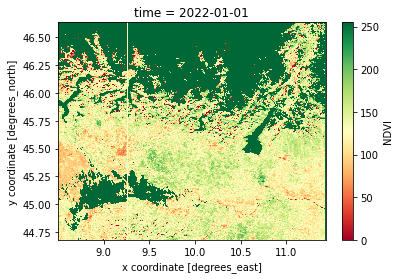

In [96]:
NDVI_AOI.isel(time=0).plot(cmap="RdYlGn")

Or through the HoloViews back-end thanks to the hvplot that acts as high-level plotting API

In [24]:
NDVI_AOI[5].hvplot(cmap="RdYlGn", width=800, height=700)

:Image   [lon,lat]   (NDVI)

In [25]:
NDVI_AOI[0].hvplot.hist(cmap="RdYlGn", width=800, height=700)

:NdOverlay   [Element]
   :Histogram   [NDVI]   (NDVI_count)

Values are a little odd in comparison with standard NDVI range values \[-1, +1]. This finds confirmation on the max values reported in the [Product User Manual](https://land.copernicus.eu/global/sites/cgls.vito.be/files/products/CGLOPS1_PUM_NDVI300m-V2_I1.20.pdf) (PUM)

## NDVI characteristics from the Product User Manual (PUM)

| layer name  | description                             | physical min | physical max | digital max | scaling | offset | No Data  |
|-------------|-----------------------------------------|--------------|--------------|-------------|---------|--------|----------|
| ndvi        | normalized difference vegetation index  | -0.08        | 0.92         | 250         | 1/250   | -0.08  | 254, 255 |
| ndvi_unc    | uncertainty on ndvi                     | 0            | 1            | 1000        | 1/1000  | 0      | 65535    |
| nobs        | number of observations                  | 0	           | 32           | 32          | 1       | 0      | 255      |
| qflag       | bitwise quality flag                    | -            | -            | 254         | 1       | 0      | 255      |


from : [Copernicus Global Land Service NDVI 300 V2.0.1](https://land.copernicus.eu/global/sites/cgls.vito.be/files/products/CGLOPS1_PUM_NDVI300m-V2_I1.20.pdf)

## Basic Computations

- Arithmetics
- Reductions

Simple arithmetic can be obtained without worry about dimensions and coordinates. Automatically the numpy component will

In [ ]:
NDVI = cgls_ds.NDVI * (1/250) - 0.08

In [101]:
NDVI

<xarray.DataArray 'NDVI' (time: 20, lat: 657, lon: 984)>
array([[[0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        ...,
        [0.252, 0.32 , 0.316, ..., 0.416, 0.352, 0.94 ],
        [0.404, 0.4  , 0.368, ..., 0.416, 0.412, 0.94 ],
        [0.372, 0.292, 0.292, ..., 0.244, 0.4  , 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        ...,
        [0.472, 0.432, 0.416, ..., 0.484, 0.464, 0.94 ],
        [0.448, 0.412, 0.392, ..., 0.56 , 0.528, 0.94 ],
        [0.444, 0.424, 0.4  , ..., 0.484, 0.496, 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        ...,
...
        ...,
        [0.484, 0.484, 0.54 , ..., 0.424, 0.484, 0.94 ],
        [0.452, 0.424, 0.484, ..., 0.488, 0.52 , 0.94 ],
        [0.432, 0.408, 0.392, ..., 0.72 , 0.64 , 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.66 , 0.68 , 0.94 ],
        [0.044, 0.044, 0.94 , ..., 0.684, 0.708, 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.712, 0.692, 0.94 ],
        ...,
        [0.54 , 0.56 , 0.604, ..., 0.268, 0.296, 0.94 ],
        [0.488, 0.52 , 0.536, ..., 0.448, 0.516, 0.94 ],
        [0.464, 0.48 , 0.532, ..., 0.564, 0.432, 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.648, 0.648, 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.7  , 0.708, 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.696, 0.708, 0.94 ],
        ...,
        [0.58 , 0.568, 0.568, ..., 0.392, 0.4  , 0.94 ],
        [0.584, 0.532, 0.528, ..., 0.548, 0.548, 0.94 ],
        [0.556, 0.484, 0.488, ..., 0.62 , 0.584, 0.94 ]]])
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-07-11
  * lon      (lon) float64 8.502 8.505 8.508 8.511 ... 11.42 11.42 11.42 11.43
  * lat      (lat) float64 46.63 46.63 46.63 46.62 ... 44.69 44.69 44.68 44.68

Same result can be achieved using the usual numpy functions.

In [98]:
NDVI_ = np.subtract(np.multiply(cgls_ds.NDVI, (1/250)), 0.08)

In [99]:
NDVI_

<xarray.DataArray 'NDVI' (time: 20, lat: 657, lon: 984)>
array([[[0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        ...,
        [0.252, 0.32 , 0.316, ..., 0.416, 0.352, 0.94 ],
        [0.404, 0.4  , 0.368, ..., 0.416, 0.412, 0.94 ],
        [0.372, 0.292, 0.292, ..., 0.244, 0.4  , 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        ...,
        [0.472, 0.432, 0.416, ..., 0.484, 0.464, 0.94 ],
        [0.448, 0.412, 0.392, ..., 0.56 , 0.528, 0.94 ],
        [0.444, 0.424, 0.4  , ..., 0.484, 0.496, 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
        ...,
...
        ...,
        [0.484, 0.484, 0.54 , ..., 0.424, 0.484, 0.94 ],
        [0.452, 0.424, 0.484, ..., 0.488, 0.52 , 0.94 ],
        [0.432, 0.408, 0.392, ..., 0.72 , 0.64 , 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.66 , 0.68 , 0.94 ],
        [0.044, 0.044, 0.94 , ..., 0.684, 0.708, 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.712, 0.692, 0.94 ],
        ...,
        [0.54 , 0.56 , 0.604, ..., 0.268, 0.296, 0.94 ],
        [0.488, 0.52 , 0.536, ..., 0.448, 0.516, 0.94 ],
        [0.464, 0.48 , 0.532, ..., 0.564, 0.432, 0.94 ]],

       [[0.94 , 0.94 , 0.94 , ..., 0.648, 0.648, 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.7  , 0.708, 0.94 ],
        [0.94 , 0.94 , 0.94 , ..., 0.696, 0.708, 0.94 ],
        ...,
        [0.58 , 0.568, 0.568, ..., 0.392, 0.4  , 0.94 ],
        [0.584, 0.532, 0.528, ..., 0.548, 0.548, 0.94 ],
        [0.556, 0.484, 0.488, ..., 0.62 , 0.584, 0.94 ]]])
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-07-11
  * lon      (lon) float64 8.502 8.505 8.508 8.511 ... 11.42 11.42 11.42 11.43
  * lat      (lat) float64 46.63 46.63 46.63 46.62 ... 44.69 44.69 44.68 44.68
Attributes:
    long_name:     NDVI
    units:         
    grid_mapping:  crs

## Statistics

In [28]:
NDVI.min()

<xarray.DataArray 'NDVI' ()>
array(-0.08)

In [29]:
NDVI.max(dim='time')

<xarray.DataArray 'NDVI' (lat: 657, lon: 984)>
array([[0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
       [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
       [0.94 , 0.94 , 0.94 , ..., 0.94 , 0.94 , 0.94 ],
       ...,
       [0.596, 0.584, 0.604, ..., 0.728, 0.804, 0.94 ],
       [0.584, 0.604, 0.588, ..., 0.708, 0.68 , 0.94 ],
       [0.556, 0.528, 0.532, ..., 0.72 , 0.64 , 0.94 ]])
Coordinates:
  * lon      (lon) float64 8.502 8.505 8.508 8.511 ... 11.42 11.42 11.42 11.43
  * lat      (lat) float64 46.63 46.63 46.63 46.62 ... 44.69 44.69 44.68 44.68

## Aggregation

In [30]:
NDVI_monthly = NDVI.groupby(NDVI.time.dt.month).mean()

In [31]:
NDVI_monthly.month

<xarray.DataArray 'month' (month: 7)>
array([1, 2, 3, 4, 5, 6, 7], dtype=int64)
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7

## Mask

Not all the values are valid one and masking all the once not in the valid range \[-0.08, 0.92] is needed. Mask can be achieved through the method .where or with xr.where
The difference consist in the possibility to specify the value in case the condition is positive or not; .where doesn't give this possibility.

In [107]:
NDVI_msked = NDVI.where((NDVI >= -0.08) & (NDVI <= 0.92)) # by default where condition is false values are set to NA

In [108]:
NDVI_msk = xr.where((NDVI <= -0.08) | (NDVI >= 0.92), 1, 0)

In [109]:
NDVI_msked.hvplot(groupby ='time', cmap="RdYlGn", width=800, height=700)

:DynamicMap   [time]
   :Image   [lon,lat]   (NDVI)

In [110]:
NDVI_msk.hvplot(groupby = 'time', cmap="RdYlGn", width=800, height=700)

:DynamicMap   [time]
   :Image   [lon,lat]   (NDVI)

Plot a single point over the time dimension

In [111]:
NDVI_msked.sel(lat=POI_lat, lon=POI_lon, method='nearest')\
    .hvplot(ylim=(-0.08, 0.92))

:Curve   [time]   (NDVI)

### Interpolation of nans
Nans can be directly interpolated through the help of [scipy](https://docs.scipy.org/doc/scipy/tutorial/interpolate.html)

In [ ]:
NDVI_msked.sel(lat=POI_lat, lon=POI_lon, method='nearest')\
    .interpolate_na('time', method='spline')\
    .hvplot(ylim=(-0.08, 0.92))

Same can be applied over the time dimension

In [112]:
NDVI_interp = NDVI_msked('time', method='linear', max_gap=pd.to_timedelta(31, 'd'))

:Curve   [time]   (NDVI)

## Clipping data according to a polygon

one of the basic concept in GIS is to clip data using a vector geometry. Xarray isn't directly capable of dealing with vectors but thanks to rioxarray can be easily achieved
Rioxarray extends Xarray with all most of the plus that Rasterio (GDAL) brings.

First step that has to be defined is the reference system

In [ ]:
NDVI_msked =NDVI_interp.rio.write_crs(4326)

Once this has been done we can clip data with the polygon that has been read through geopandas at the beginning of the notebook.

In [ ]:
NDVI_AOI = NDVI_msked.rio.clip(AOI_poly, crs=4326)

Once data is limited to the AOI a histogram can be added to the visualization.

In [38]:
NDVI_AOI.hvplot(groupby='time', cmap='RdYlGn', width=800, height=700 ).hist()

:AdjointLayout
   :DynamicMap   [time]
      :Image   [lon,lat]   (NDVI)
   :DynamicMap   [time]
      :Histogram   [NDVI]   (NDVI_count)

In [ ]:
#Proposal : start region '02_Introduction_to_Dask'

### Introduction to the Long Term statistics

CGLS LTS are computed over a time span of 20 years aggregated over each 10 days period (month/01,month/11, month/21). For each date the long term minimum, maximum, mean, median and standard deviation are computed.

In [40]:
NDVI_LTS = xr.open_dataset(rf'.\data\CopernicusGlobalLand\LTS\c_gls_NDVI-LTS_1999-2019-0101_GLOBE_VGT-PROBAV_V3.0.1.nc')

In [41]:
NDVI_LTS.sel(lat=POI_lat, lon=POI_lon, method='nearest')['min'].values

array(0.108, dtype=float32)

In [ ]:
LTS = xr.open_mfdataset(rf'.\data\CopernicusGlobalLand\LTS\*.nc', combine='nested', concat_dim=['time'], decode_coords="all")

In [56]:
LTS

<xarray.Dataset>
Dimensions:  (lon: 40320, lat: 15680, time: 36)
Coordinates:
  * lon      (lon) float64 -180.0 -180.0 -180.0 -180.0 ... 180.0 180.0 180.0
  * lat      (lat) float64 80.0 79.99 79.98 79.97 ... -59.97 -59.98 -59.99
    crs      |S1 b''
Dimensions without coordinates: time
Data variables:
    min      (time, lat, lon) float32 dask.array<chunksize=(1, 15680, 40320), meta=np.ndarray>
    median   (time, lat, lon) float32 dask.array<chunksize=(1, 15680, 40320), meta=np.ndarray>
    max      (time, lat, lon) float32 dask.array<chunksize=(1, 15680, 40320), meta=np.ndarray>
    mean     (time, lat, lon) float32 dask.array<chunksize=(1, 15680, 40320), meta=np.ndarray>
    stdev    (time, lat, lon) float32 dask.array<chunksize=(1, 15680, 40320), meta=np.ndarray>
    nobs     (time, lat, lon) float32 dask.array<chunksize=(1, 15680, 40320), meta=np.ndarray>
Attributes: (12/19)
    Conventions:          CF-1.6
    parent_identifier:    urn:cgls:global:ndvi_stats_all
    identifier:           urn:cgls:global:ndvi_stats_all:NDVI-LTS_1999-2019-0...
    long_name:            Normalized Difference Vegetation Index
    title:                Normalized Difference Vegetation Index: Long Term S...
    product_version:      V3.0.1
    ...                   ...
    source:               Derived from EO satellite imagery
    processing_mode:      Offline
    references:           https://land.copernicus.eu/global/products/ndvi
    copyright:            Copernicus Service information 2021
    archive_facility:     VITO
    history:              2021-03-01 - Processing line NDVI LTS

Note! If you use one of xarray’s open methods such as xarray.open_dataset to load netCDF files with the default engine, it is recommended to use decode_coords=”all”. This will load the grid mapping variable into coordinates for compatibility with rioxarray. From [rioxarray documentation](https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html#xarray)


In [57]:
LTS = LTS.rio.write_crs(4326)

In [58]:
LTS = LTS.sel(lat=slice(AOI_max_lat,AOI_min_lat) ,lon=slice(AOI_min_lon,AOI_max_lon))

In [59]:
LTS = LTS.rio.clip(AOI_poly, crs=4326)

In [60]:
LTS = LTS.chunk({'time':-1, 'lat':'5MB', 'lon':'5MB'})

As the time dimension is defined as 'year less' (don't forget that are aggregated values spanning between 1999 and 2019) to let Xarray align values, the index needs to be reformed to the current year.

In [ ]:
dates_2022 = pd.date_range('20220101', '20221231')
decadie = dates_2022[np.isin(dates_2022.day, [1,11,21])]

In [63]:
decadie

DatetimeIndex(['2022-01-01', '2022-01-11', '2022-01-21', '2022-02-01',
               '2022-02-11', '2022-02-21', '2022-03-01', '2022-03-11',
               '2022-03-21', '2022-04-01', '2022-04-11', '2022-04-21',
               '2022-05-01', '2022-05-11', '2022-05-21', '2022-06-01',
               '2022-06-11', '2022-06-21', '2022-07-01', '2022-07-11',
               '2022-07-21', '2022-08-01', '2022-08-11', '2022-08-21',
               '2022-09-01', '2022-09-11', '2022-09-21', '2022-10-01',
               '2022-10-11', '2022-10-21', '2022-11-01', '2022-11-11',
               '2022-11-21', '2022-12-01', '2022-12-11', '2022-12-21'],
              dtype='datetime64[ns]', freq=None)

In [65]:
LTS = LTS.assign_coords(time=decadie)

In [66]:
LTS

<xarray.Dataset>
Dimensions:      (lat: 219, lon: 327, time: 36)
Coordinates:
  * lat          (lat) float64 46.63 46.63 46.62 46.61 ... 44.71 44.7 44.69
  * lon          (lon) float64 8.509 8.518 8.527 8.536 ... 11.4 11.41 11.42
    spatial_ref  int32 0
    crs          int32 0
  * time         (time) datetime64[ns] 2022-01-01 2022-01-11 ... 2022-12-21
Data variables:
    min          (time, lat, lon) float32 dask.array<chunksize=(36, 152, 227), meta=np.ndarray>
    median       (time, lat, lon) float32 dask.array<chunksize=(36, 152, 227), meta=np.ndarray>
    max          (time, lat, lon) float32 dask.array<chunksize=(36, 152, 227), meta=np.ndarray>
    mean         (time, lat, lon) float32 dask.array<chunksize=(36, 152, 227), meta=np.ndarray>
    stdev        (time, lat, lon) float32 dask.array<chunksize=(36, 152, 227), meta=np.ndarray>
    nobs         (time, lat, lon) float32 dask.array<chunksize=(36, 152, 227), meta=np.ndarray>
Attributes: (12/19)
    Conventions:          CF-1.6
    parent_identifier:    urn:cgls:global:ndvi_stats_all
    identifier:           urn:cgls:global:ndvi_stats_all:NDVI-LTS_1999-2019-0...
    long_name:            Normalized Difference Vegetation Index
    title:                Normalized Difference Vegetation Index: Long Term S...
    product_version:      V3.0.1
    ...                   ...
    source:               Derived from EO satellite imagery
    processing_mode:      Offline
    references:           https://land.copernicus.eu/global/products/ndvi
    copyright:            Copernicus Service information 2021
    archive_facility:     VITO
    history:              2021-03-01 - Processing line NDVI LTS

In [50]:
LTS.sel(lat=POI_lat, lon=POI_lon, method='nearest')['min'].values

array([0.10800001, 0.10800001, 0.17600001, 0.16800001, 0.128     ,
       0.172     , 0.20800002, 0.216     , 0.26      , 0.32      ,
       0.33600003, 0.33600003, 0.34000003, 0.39200002, 0.36400002,
       0.30800003, 0.34400004, 0.37200004, 0.39600003, 0.42400002,
       0.51600003, 0.55200005, 0.55200005, 0.512     , 0.48000002,
       0.43600005, 0.384     , 0.37200004, 0.33200002, 0.268     ,
       0.30400002, 0.28800005, 0.28800005, 0.268     , 0.244     ,
       0.19200002], dtype=float32)

In [51]:
LTS.to_zarr(rf'.\data\CopernicusGlobalLand\LTS\c_gls_NDVI-LTS_1999-2019-{AOI_name}_VGT-PROBAV_V3.zarr', mode='w', )

In [52]:
LTS = xr.open_zarr(rf'.\data\CopernicusGlobalLand\LTS\c_gls_NDVI-LTS_1999-2019-{AOI_name}_VGT-PROBAV_V3.zarr')

In [ ]:
LTS_NDVI_POI = LTS.sel(lat=POI_lat, lon=POI_lon, method='nearest')

In [ ]:
POI_min = LTS_NDVI_POI['min']
POI_max = LTS_NDVI_POI['max']
POI_std = LTS_NDVI_POI['stdev']
POI_mean = LTS_NDVI_POI['mean']
POI = NDVI_AOI.sel(lat=POI_lat, lon=POI_lon, method='nearest')

In [ ]:
(POI.hvplot(width=1000, height=700, label='NDVI') *
 POI_mean.hvplot(c='grey', label='mean LTS 1999-2019', alpha=0.2, line_dash='dashed') *
 POI_min.hvplot(c='b',label='min LTS 1999-2019', alpha=0.2, line_dash='dashed') *
 POI_max.hvplot(c='r', label='Max LTS 1999-2019', alpha=0.2, line_dash='dashed') *
 hv.Area((POI_mean.time, POI_mean - POI_std, POI_mean + POI_std ), vdims=['- Std', '+ Std'], label='Standard deviation LTS 1999-2019',).opts( color='blue', alpha=0.2))\
    .opts(title=f"CGLS S3 300m NDVI fluctuation over the year 2022 in comparison with CGLS Long Term Statistics\nPoint of interest Lat {np.round(POI.lat.data,2)} Lon {np.round(POI.lon.data,2)}",
          legend_position='bottom_right')

Clip the dataset over the AOI

In [ ]:
LTS = LTS.rio.write_crs(4326)

In [ ]:
LTS = LTS.rio.clip(AOI_poly, crs=4326)

The nominal spatial resolution of the Long term statistics is 1km. As the current NDVI product has a nominal spatial resolution of 300m a re projection is needed.
RioXarray through RasterIO that wraps the GDAL method can take care of this.
More info about all the options can be found [here](https://rasterio.readthedocs.io/en/stable/api/rasterio.warp.html#rasterio.warp.reproject)

In [ ]:
NDVI_1k = NDVI_AOI.rio.reproject_match(LTS)

In [ ]:
NDVI_1k.coords

RioXarray does a great job, but it looses the coordinates names. To be able to combine different dataset coords needs to be renamed.

In [ ]:
NDVI_1k = NDVI_1k.rename({'x': 'lon', 'y':'lat'})

In [ ]:
NDVI_1k.coords

In [ ]:
# NDVI_1k = NDVI_1k.where((NDVI_1k >= -0.08) & (NDVI_1k <= 0.92))

In [ ]:
NDVI_1k.hvplot(groupby='time', cmap='RdYlGn', width=800, height=700)

The Vegetation Condition Index (VCI) compares the current NDVI to the range of values observed in the same period in previous years. The VCI is expressed in % and gives an idea where the observed value is situated between the extreme values (minimum and maximum) in the previous years.

In [ ]:
VCI = ((NDVI_1k - LTS['min']) / (LTS['max'] - LTS['min'])) * 100

In [ ]:
VCI.name = 'VCI'

In [ ]:
VCI.isel(time=4).hvplot()

In [ ]:
VCI.sel(lat=POI_lat, lon=POI_lon, method='nearest').hvplot.hist()

In [ ]:
VCI.plot()

In [ ]:
VCI.isel(time=-1).hvplot.contourf(cmap='RdYlGn', alpha=0.7,
                                  levels=[-200,-100,-50, 0,50,100,200],
                                  geo=True, tiles= 'CartoLight',
                                  width=800, height=700,
                                  title=f'CGLS VCI {AOI_name} {VCI.isel(time=-1).time.dt.date.data}')

In [ ]:
# Proposal : Start region 03_Exercise

### Execise: Using the Global Land Cover mask all the urban areas

In [ ]:
session.describe_collection('GLOBAL_LAND_COVER')

In [ ]:
datacube_LC = session.load_collection(
    'GLOBAL_LAND_COVER',
    spatial_extent={"west": AOI_min_lon, "south":AOI_min_lat , "east": AOI_max_lon, "north":AOI_max_lat },
    bands=['Discrete_Classification_map']
)

In [ ]:
datacube_LC.download(f"C_GLS_LC_20220101_20220701_{AOI_name}_PROBA_3.nc", format="NetCDF")

In [ ]:
cgls_LC= xr.open_dataset('C_GLS_LC_20220101_20220701_CENTRALITALY_3.nc')

In [ ]:
LC_2019 = cgls_LC.Discrete_Classification_map.sel(t='2019-01-01')

In [ ]:
LC_2019 = LC_2019.rio.write_crs(4326)

In [ ]:
LC_2019 = LC_2019.rio.reproject_match(LTS)

In [ ]:
LC_2019

In [ ]:
urban_mask = xr.where(LC_2019 == 50, False, True).rename({'x': 'lon', 'y':'lat'})

In [ ]:
urban_mask.hvplot(width=800, height=700)

In [ ]:
VCI_masked = VCI.where(urban_mask) 

In [ ]:
VCI_masked.name = 'VCI masked'

In [ ]:
VCI_masked.isel(time=0).hvplot(cmap='RdYlGn', alpha=0.7,
                                  geo=True, tiles= 'CartoLight',
                                  width=800, height=700,)